In [1]:
import crested

2025-08-12 10:28:10.542082: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-12 10:28:10.575228: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-12 10:28:10.844799: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-12 10:28:11.087609: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755019691.297863 3489072 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755019691.36

In [2]:
import anndata as ad
adata_hum = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/human/crested_adata/human_basalganglia_hmba_pre-print_crested.h5ad")
adata_mac = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/macaque/crested_adata/macaque_basalganglia_hmba_pre-print_crested.h5ad")

adatas = [adata_hum, adata_mac]

In [3]:
import pickle
with open("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/macaque/patterns/patterns_updated.pkl", "rb") as f:
    all_patterns_mac = pickle.load(f)

In [4]:
import pickle
with open("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/human/patterns/patterns_updated.pkl", "rb") as f:
    all_patterns_hum = pickle.load(f)

In [5]:
pattern_list = [all_patterns_hum, all_patterns_mac]

# TF matching

In [6]:
import crested
import anndata

#Order: Human, Macaque, (Marmoset)
file_paths = [
    ("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/s3/AIT/Human_HMBA_basalganglia_AIT_pre-print.h5ad"),
    ("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/s3/AIT/Macaque_HMBA_basalganglia_AIT_pre-print.h5ad"),
]
cell_type_column = "Group"

mean_expression_df_list =[]

for file in file_paths:
    mean_expression_df = crested.tl.modisco.calculate_mean_expression_per_cell_type(
        file, cell_type_column, cpm_normalize=False
    )
    mean_expression_df_list.append(mean_expression_df)

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/crested/tl/modisco/_tfmodisco.py:1633: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expression_per_cell_type: pd.DataFrame = gene_expression_df.groupby(
/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/crested/tl/modisco/_tfmodisco.py:1633: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expression_per_cell_type: pd.DataFrame = gene_expression_df.groupby(


In [7]:
def _norm(x):
    return str(x).strip().replace(" ", "_")

for i in range(len(mean_expression_df_list)):
    # Normalize DF index once and for all
    mean_expression_df_list[i].index = mean_expression_df_list[i].index.map(_norm)

    # Also normalize obs_names view (don’t mutate AnnData)
    obs_norm = [ _norm(x) for x in adatas[i].obs_names ]

    set_df  = set(mean_expression_df_list[i].index)
    set_obs = set(obs_norm)

    overlap        = set_df & set_obs
    only_in_df     = set_df - set_obs
    only_in_obs    = set_obs - set_df

    print(f"\nDataset {i}")
    print("Overlap (n):", len(overlap))
    print("Only in DF:", only_in_df)
    print("Only in obs:", only_in_obs)

    # (Optional) check for duplicates post‑normalization
    dupes = mean_expression_df_list[i].index[mean_expression_df_list[i].index.duplicated()].unique()
    if len(dupes):
        print("Duplicates after normalization:", list(dupes))

    # Safe subsetting: keep DF rows in the obs order, dropping non-overlap
    common_ordered = [x for x in obs_norm if x in overlap]
    mean_expression_df_list[i] = mean_expression_df_list[i].loc[common_ordered]


Dataset 0
Overlap (n): 59
Only in DF: {'SN_GATA3-PVALB_GABA'}
Only in obs: set()

Dataset 1
Overlap (n): 58
Only in DF: set()
Only in obs: set()


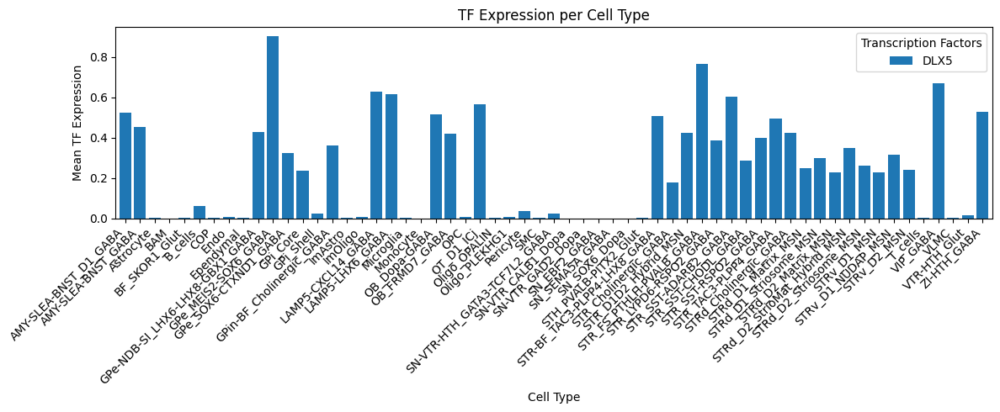

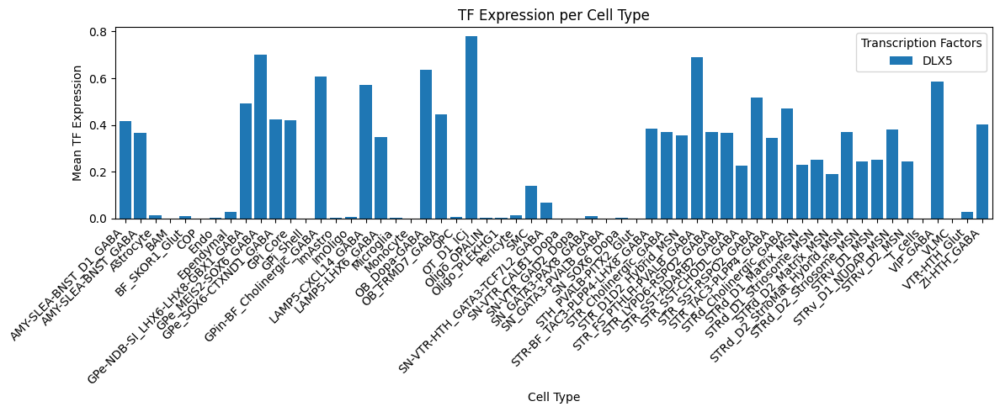

In [8]:
%matplotlib inline
for mean_expression_df in mean_expression_df_list:
    crested.pl.patterns.tf_expression_per_cell_type(
        mean_expression_df, ["DLX5"]
    )

In [9]:
meme_db, motif_to_tf_file = crested.get_motif_db()
motif_to_tf_df = crested.tl.modisco.read_motif_to_tf_file(
   motif_to_tf_file
)

In [10]:
class_lists = [list(adata.obs_names) for adata in adatas]
contribution_dirs = [
    "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/human/patterns/modisco_results_ft_500/",
    "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/macaque/patterns/modisco_results_ft_500/"
]
pattern_match_dict_list = []

for i in range(len(class_lists)): 
    html_paths = crested.tl.modisco.generate_html_paths(
        pattern_list[i], class_lists[i], contribution_dirs[i]
    )
    
    pattern_match_dict = crested.tl.modisco.find_pattern_matches(
        pattern_list[i], html_paths, q_val_thr=0.05
    ) 
    pattern_match_dict_list.append(pattern_match_dict)

In [11]:
tf_ct_matrix_list=[]
tf_pattern_annots_list=[]

cols = [
    "Human_Direct_annot",
    "Human_Orthology_annot",
    "Cluster_Human_Direct_annot",
    "Cluster_Human_Orthology_annot",
]

for i in range(len(pattern_match_dict_list)):
    pattern_tf_dict, all_tfs = crested.tl.modisco.create_pattern_tf_dict(
        pattern_match_dict_list[i], motif_to_tf_df, pattern_list[i], cols
    )
    tf_ct_matrix, tf_pattern_annots = crested.tl.modisco.create_tf_ct_matrix(
        pattern_tf_dict,
        pattern_list[i],
        mean_expression_df_list[i],
        class_lists[i],
        log_transform=False,
        normalize_pattern_importances=False,
        normalize_gex=True,
        min_tf_gex=0.95,
        importance_threshold=4,
        pattern_parameter="seqlet_count_log",
        filter_correlation=True,
        verbose=True,
        zscore_threshold=1.25,
        correlation_threshold=0.4,
    )
    tf_ct_matrix_list.append(tf_ct_matrix)
    tf_pattern_annots_list.append(tf_pattern_annots)


Total columns before threshold filtering: 2618
Total columns after threshold filtering: 385
Total columns removed: 2233
Total columns before correlation filtering: 385
Total columns after correlation filtering: 135
Total columns removed: 250
Total columns before threshold filtering: 3662
Total columns after threshold filtering: 584
Total columns removed: 3078
Total columns before correlation filtering: 584
Total columns after correlation filtering: 190
Total columns removed: 394


/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/crested/pl/patterns/_modisco_results.py:1125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


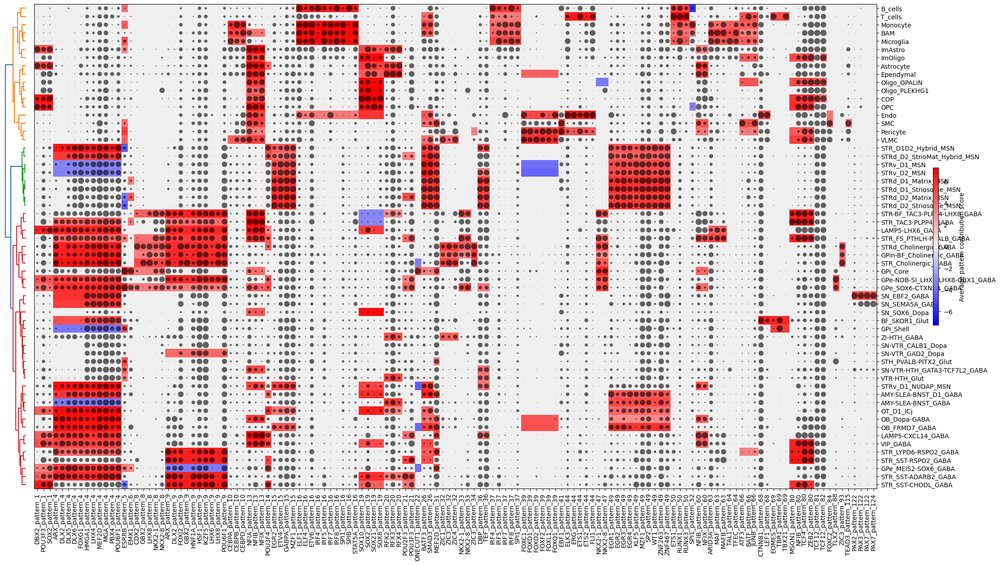

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/crested/pl/patterns/_modisco_results.py:1125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


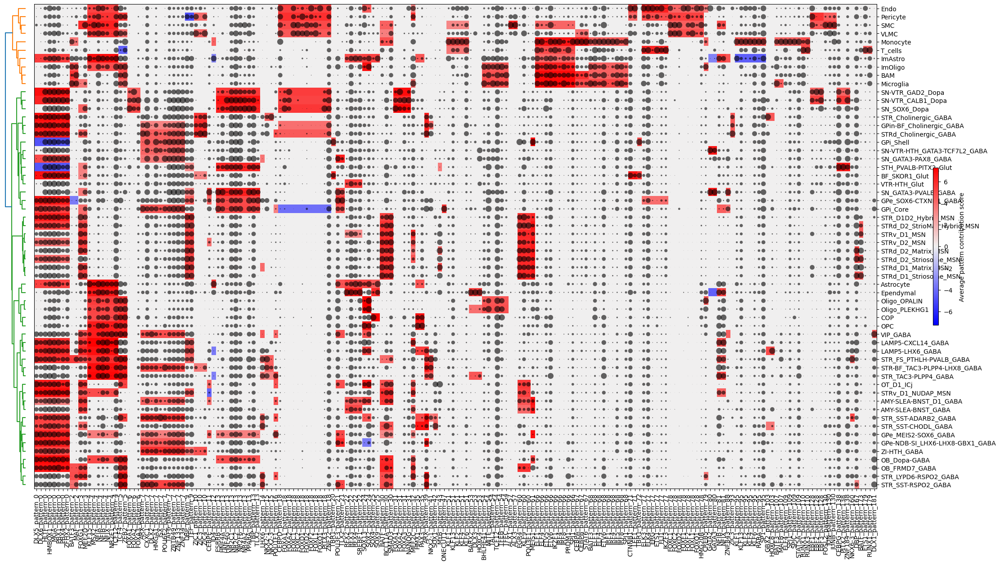

In [12]:
for i in range(len(tf_ct_matrix_list)):
    crested.pl.patterns.clustermap_tf_motif(
        tf_ct_matrix_list[i],
        heatmap_dim="contrib",
        dot_dim="gex",
        class_labels=class_lists[i],
        pattern_labels=tf_pattern_annots_list[i],
        fig_size=(25, 14),
        cluster_rows=True,
        cluster_columns=False,
    )

In [13]:
tf_ct_mat = tf_ct_matrix_list[0]


In [14]:
import pandas as pd

def get_human_ortholog(gene_name, species_name, ortholog_table, species_conversion=None):
    """
    Given a non-human gene name and species name, return the human ortholog symbol.

    Parameters
    ----------
    gene_name : str
        The gene name in the original species.
    species_name : str
        The scientific name of the species (e.g., 'Macaca Mulatta' or 'Macaca_mulatta').
    ortholog_table : pd.DataFrame
        Table with columns: 'species', 'gene', 'ortholog_symbol'.
    species_conversion : dict, optional
        Mapping from original species names to the format used in ortholog_table.

    Returns
    -------
    str or None
        The human ortholog symbol if found, else None.
    """
    # Normalize species name if conversion mapping is provided
    if species_conversion is not None:
        species_name = species_conversion.get(species_name, species_name)

    # Filter ortholog table for that species
    subset = ortholog_table.loc[ortholog_table['species'] == species_name]

    if subset.empty:
        print(f"Species '{species_name}' not found in ortholog table.")
        return None

    # Lookup
    match = subset.loc[subset['gene'] == gene_name, 'ortholog_symbol']
    if match.empty:
        print(f"Gene '{gene_name}' not found for species '{species_name}'.")
        return None

    return match.iloc[0]

In [15]:
import numpy as np
import scipy.stats as stats
import pandas as pd
from tqdm import tqdm

tf_ct_dict_list = []

tf_ct_dict = {}
species = ['Human','Macaque']
species_names = ['Homo_sapiens', 'Macaca_mulatta']

ortholog_table = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/genomes/cleanome_genomes2/all_gene_ids.csv', header=0)

for a in range(len(tf_ct_matrix_list)):
    tf_ct_dict[species[a]] = {}
    
    tf_ct_mat = tf_ct_matrix_list[a]
    tf_pattern_annots = tf_pattern_annots_list[a]

    tf_scores_pearson = [np.corrcoef(tf_ct_mat[:,x,0],np.abs(tf_ct_mat[:,x,1]))[0, 1] for x in range(tf_ct_mat.shape[1])]
    tf_scores_spearman = [stats.spearmanr(tf_ct_mat[:,x,0],np.abs(tf_ct_mat[:,x,1]))[0] for x in range(tf_ct_mat.shape[1])]
    
    for i, cl in tqdm(enumerate(class_lists[a])):
        vals = tf_ct_mat[i, :, 1]
        mask = vals > 0
        top_motifs = np.argsort(vals[mask])[::-1]
        top_motifs = np.where(mask)[0][top_motifs]

        top_tfs = np.array(tf_pattern_annots)[top_motifs]
        top_motifs_names = [tf.split('_')[2] for tf in top_tfs]
        top_tfs = [tf.split('_')[0] for tf in top_tfs]

        tf_expression = [mean_expression_df_list[a].loc[cl][tf] for tf in top_tfs]

        og_tfs = None

        if species[a]!='Human':
            og_tfs = top_tfs
            ortholog_map = (
                ortholog_table.loc[ortholog_table['species'] == species_names[a]]
                .set_index('gene')['ortholog_symbol']
                .to_dict()
            )
            
            # Map all TFs in one go
            top_tfs_series = pd.Series(top_tfs, dtype=object)
            mapped_tfs = top_tfs_series.map(ortholog_map)  # NaN if not found
            # Fill missing with original TF name
            mapped_tfs = mapped_tfs.fillna(top_tfs_series)
            
            top_tfs = mapped_tfs.to_list()
        tf_ct_dict[species[a]][cl] = {}
        tf_ct_dict[species[a]][cl]['TFs'] = top_tfs
        tf_ct_dict[species[a]][cl]['Motif_ids'] = top_motifs_names
        tf_ct_dict[species[a]][cl]['Motif_scores'] = vals[top_motifs]
        tf_ct_dict[species[a]][cl]['TF confidence (Pearson)'] = np.array(tf_scores_pearson)[top_motifs]
        tf_ct_dict[species[a]][cl]['TF confidence (Spearman)'] = np.array(tf_scores_spearman)[top_motifs]
        tf_ct_dict[species[a]][cl]['Absolute TF expression'] = tf_expression
        tf_ct_dict[species[a]][cl]['Relative TF expression'] = tf_ct_mat[i, :, 0][top_motifs]
        if og_tfs:
            tf_ct_dict[species[a]][cl]['Original TFs'] = og_tfs

        


59it [00:00, 1508.60it/s]
58it [00:06,  8.59it/s]


In [16]:
# Make sure 'Combined' exists
tf_ct_dict['Combined'] = {}

# Get the class sets for each species
human_classes   = set(tf_ct_dict['Human'].keys())
macaque_classes = set(tf_ct_dict['Macaque'].keys())

# Classes present in both
shared_classes  = human_classes & macaque_classes
# Classes unique to each
human_only      = human_classes - macaque_classes
macaque_only    = macaque_classes - human_classes

# Handle shared classes: keep only TFs found in both
for cl in shared_classes:
    tfs_human   = set(tf_ct_dict['Human'][cl]['TFs'])
    tfs_macaque = set(tf_ct_dict['Macaque'][cl]['TFs'])
    common_tfs  = sorted(tfs_human & tfs_macaque)  # intersection, sorted for consistency

    tf_ct_dict['Combined'][cl] = {'TFs': common_tfs}

# Handle human-only classes
for cl in human_only:
    tf_ct_dict['Combined'][cl] = {'TFs': tf_ct_dict['Human'][cl]['TFs']}

# Handle macaque-only classes
for cl in macaque_only:
    tf_ct_dict['Combined'][cl] = {'TFs': tf_ct_dict['Macaque'][cl]['TFs']}

In [22]:
import pickle
with open("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/basal-ganglia/data/cross_species/motif_analysis/tf_dict_human_macaque.pkl", "wb") as f:
     pickle.dump(tf_ct_dict, f)

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_class_tf_heatmaps(
    tf_ct_dict,
    class_name,
    species=('Human', 'Macaque'),
    metrics=None,                  # e.g. ['Motif_scores','Relative TF expression','TF scores (Pearson)','TF scores (Spearman)']
    aggregate='max',               # 'max'|'mean'|'median'
    normalize_per_metric=True,
    fill_value=np.nan,
    row_height=0.25,               # height per TF row
    base_height=2.5,               # extra height for titles, colorbars
    base_width_per_panel=1.5,      # width per panel (scaled by #metrics)
    annot=False,
    fmt='.2f',
    cmap='magma',
    save_path=None,
):
    """
    Adjacent heatmaps (one per species) for a given class.
    Rows = TFs (shared first, then species-unique). Row labels per species include TF and motif ID.
    Missing TFs in the other species are filled with `fill_value` (default NaN).
    """

    def _species_long(sp):
        """Return long DF with columns: TF, motif_id, <metric1> ..."""
        if sp not in tf_ct_dict or class_name not in tf_ct_dict[sp]:
            return pd.DataFrame()

        entry = tf_ct_dict[sp][class_name]
        all_keys = list(entry.keys())
        use_metrics = metrics if metrics is not None else [k for k in all_keys if k not in ('TFs','Motif_ids', 'Original TFs')]

        tfs = np.asarray(entry['TFs'])
        motif_ids = np.asarray(entry['Motif_ids'])
        cols = {m: np.asarray(entry[m]) for m in use_metrics}

        # sanity check
        n = len(tfs)
        if len(motif_ids) != n or any(len(cols[m]) != n for m in use_metrics):
            raise ValueError(f"Inconsistent lengths for species '{sp}', class '{class_name}'.")

        df = pd.DataFrame({'TF': tfs, 'motif_id': motif_ids})
        for m in use_metrics: df[m] = cols[m]
        return df, use_metrics

    def _aggregate_by_tf(df_long, use_metrics):
        """Aggregate duplicates by TF and remember the representative motif_id (e.g., max Motif_scores)."""
        if df_long.empty:
            return pd.DataFrame(), {}

        if aggregate == 'max':
            agg_fun = np.nanmax
        elif aggregate == 'mean':
            agg_fun = np.nanmean
        elif aggregate == 'median':
            agg_fun = np.nanmedian
        else:
            raise ValueError("aggregate must be one of {'max','mean','median'}")

        # choose a representative motif per TF based on the primary ranking metric if present
        primary_metric = 'Motif_scores' if 'Motif_scores' in use_metrics else use_metrics[0]

        reps = {}
        rows = []
        for tf, sub in df_long.groupby('TF'):
            # representative motif: argmax by primary_metric (or appropriate reducer)
            if aggregate == 'max':
                idx = sub[primary_metric].values.argmax()
            else:
                # fall back to the motif with the highest primary_metric for labeling
                idx = sub[primary_metric].values.argmax()

            reps[tf] = int(sub['motif_id'].iloc[idx])

            row = {m: agg_fun(sub[m].values.astype(float)) for m in use_metrics}
            row['TF'] = tf
            rows.append(row)

        df_wide = pd.DataFrame(rows).set_index('TF')
        return df_wide, reps

    # Build per-species tables and representatives
    df_sp, reps_sp, use_metrics_global = {}, {}, None
    for sp in species:
        long_df, use_metrics_sp = _species_long(sp)
        if use_metrics_global is None and len(use_metrics_sp) > 0:
            use_metrics_global = use_metrics_sp
        df_wide, reps = _aggregate_by_tf(long_df, use_metrics_sp if metrics is None else metrics)
        df_sp[sp], reps_sp[sp] = df_wide, reps

    if use_metrics_global is None:
        raise ValueError(f"No metrics found to plot for class '{class_name}'.")

    use_metrics = metrics if metrics is not None else use_metrics_global

    # Determine TF ordering: shared first, then unique blocks (alphabetical)
    idx_sets = {sp: set(df_sp[sp].index) for sp in species}
    shared = sorted(set.intersection(*idx_sets.values())) if all(len(s)>0 for s in idx_sets.values()) else []
    unique_blocks = []
    if len(species) == 2:
        s0_only = sorted(idx_sets[species[0]] - idx_sets[species[1]])
        s1_only = sorted(idx_sets[species[1]] - idx_sets[species[0]])
        unique_blocks = [s0_only, s1_only]
    else:
        for k, sp in enumerate(species):
            others = set().union(*[idx_sets[o] for j, o in enumerate(species) if j != k])
            unique_blocks.append(sorted(idx_sets[sp] - others))

    ordered_tfs = list(shared)
    for block in unique_blocks:
        ordered_tfs.extend(block)

    # Reindex and fill
    for sp in species:
        if df_sp[sp].empty:
            df_sp[sp] = pd.DataFrame(columns=use_metrics, index=ordered_tfs)
        else:
            df_sp[sp] = df_sp[sp].reindex(ordered_tfs)
        if not (isinstance(fill_value, float) and np.isnan(fill_value)):
            df_sp[sp] = df_sp[sp].fillna(fill_value)

    # Normalize per metric jointly across panels (optional)
    if normalize_per_metric:
        maxs = {}
        for m in use_metrics:
            vals = []
            for sp in species:
                if m in df_sp[sp].columns:
                    arr = df_sp[sp][m].to_numpy(dtype=float)
                    vals.append(arr[np.isfinite(arr)])
            if len(vals) == 0:
                continue
            allv = np.concatenate(vals) if len(vals) else np.array([])
            vmax = np.nanmax(allv) if allv.size else 1.0
            if vmax == 0:
                vmax = 1.0
            maxs[m] = vmax
        for sp in species:
            for m in use_metrics:
                if m in df_sp[sp].columns:
                    df_sp[sp][m] = df_sp[sp][m].astype(float) / maxs[m]

    # Dynamic sizing: width ~ metrics, height ~ #rows
    n_rows = max(1, len(ordered_tfs))
    panel_width = max(base_width_per_panel, 0.5 * len(use_metrics) + 1.6)
    fig_width = panel_width * len(species)
    fig_height = base_height + row_height * n_rows

    fig, axes = plt.subplots(1, len(species), figsize=(fig_width, fig_height), constrained_layout=True)
    if len(species) == 1:
        axes = [axes]

    # Prepare species-specific ytick labels: "TF (motif_id)"
    display_labels = {sp: [] for sp in species}
    for sp in species:
        reps = reps_sp[sp]
        for tf in ordered_tfs:
            if tf in reps:
                display_labels[sp].append(f"{tf} ({reps[tf]})")
            else:
                display_labels[sp].append(f"{tf} (—)")

    # Plot
    for ax, sp in zip(axes, species):
        if df_sp[sp].empty:
            ax.axis('off')
            ax.set_title(f"{sp} (no data)")
            continue

        sns.heatmap(
            df_sp[sp][use_metrics],
            ax=ax,
            cmap=cmap,
            cbar=True,
            linewidths=0.1,
            linecolor='black',
            annot=annot,
            fmt=fmt,
            yticklabels=display_labels[sp]
        )
        ax.set_title(f"{sp} — {class_name}")
        ax.set_xlabel("Metrics")
        ax.set_ylabel("TF (motif_id)")

        # Separator between shared and unique
        if len(shared) and len(ordered_tfs) > len(shared):
            ax.hlines(len(shared), *ax.get_xlim(), linewidth=1.5, colors='white')

        # Make y tick labels a bit smaller if many rows
        if n_rows > 40:
            ax.tick_params(axis='y', labelsize=7)
        elif n_rows > 25:
            ax.tick_params(axis='y', labelsize=8)
        else:
            ax.tick_params(axis='y', labelsize=9)

    fig.suptitle(f"TF metrics per species for class '{class_name}'", y=1.02, fontsize=12)
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

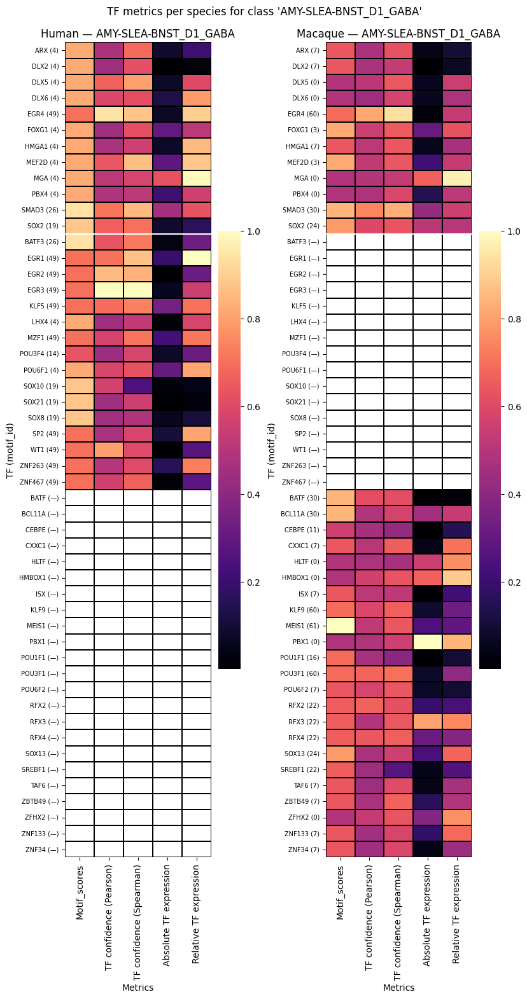

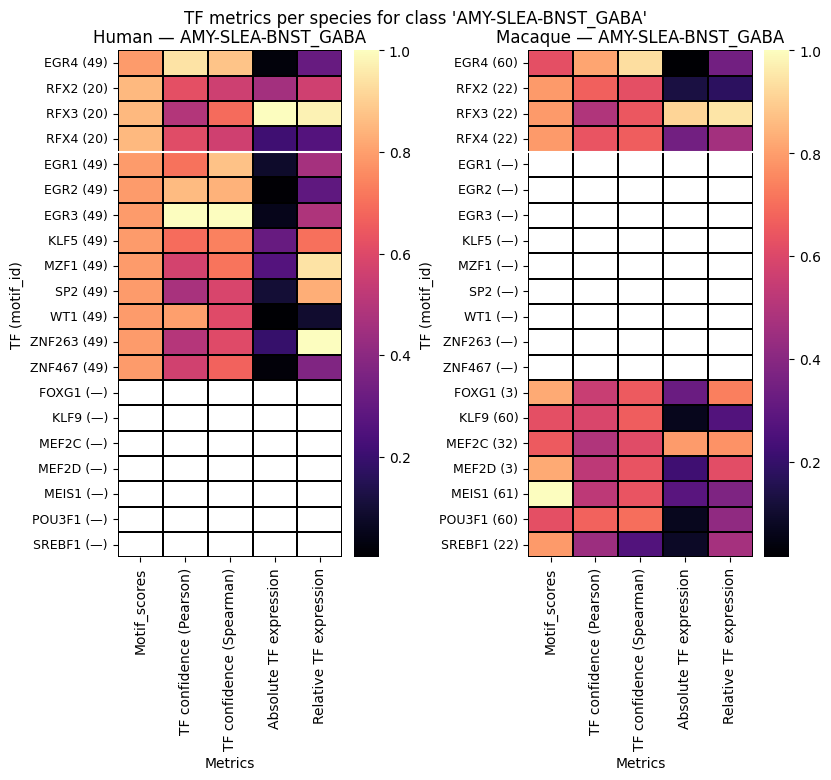

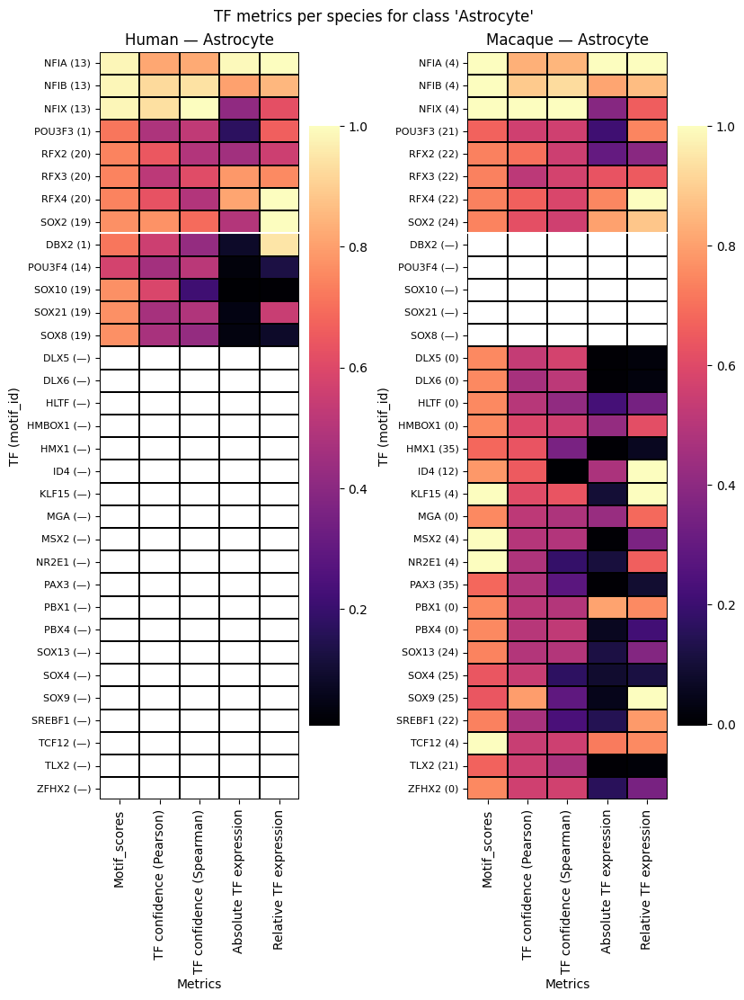

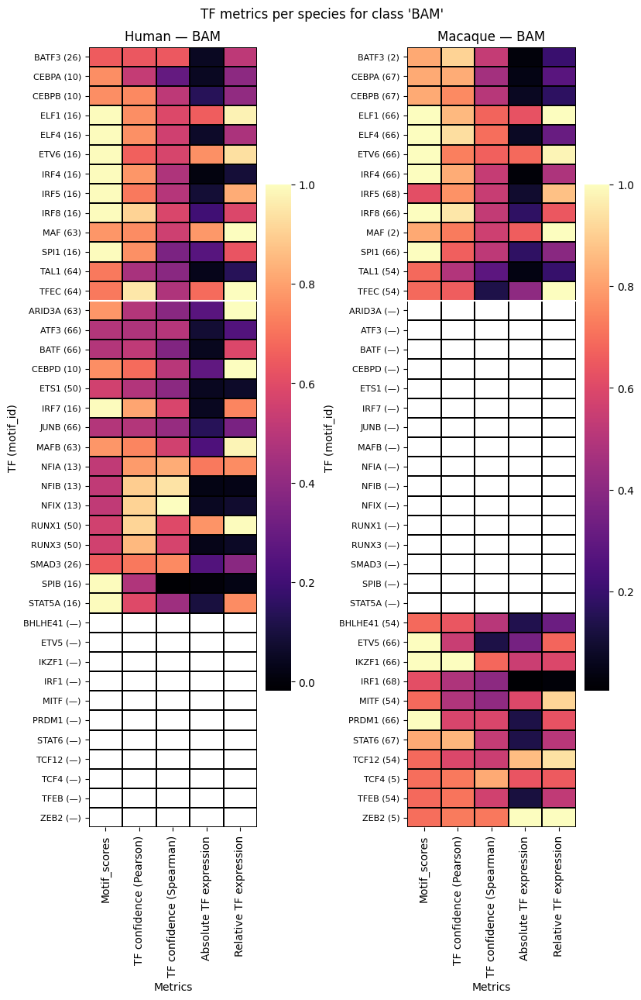

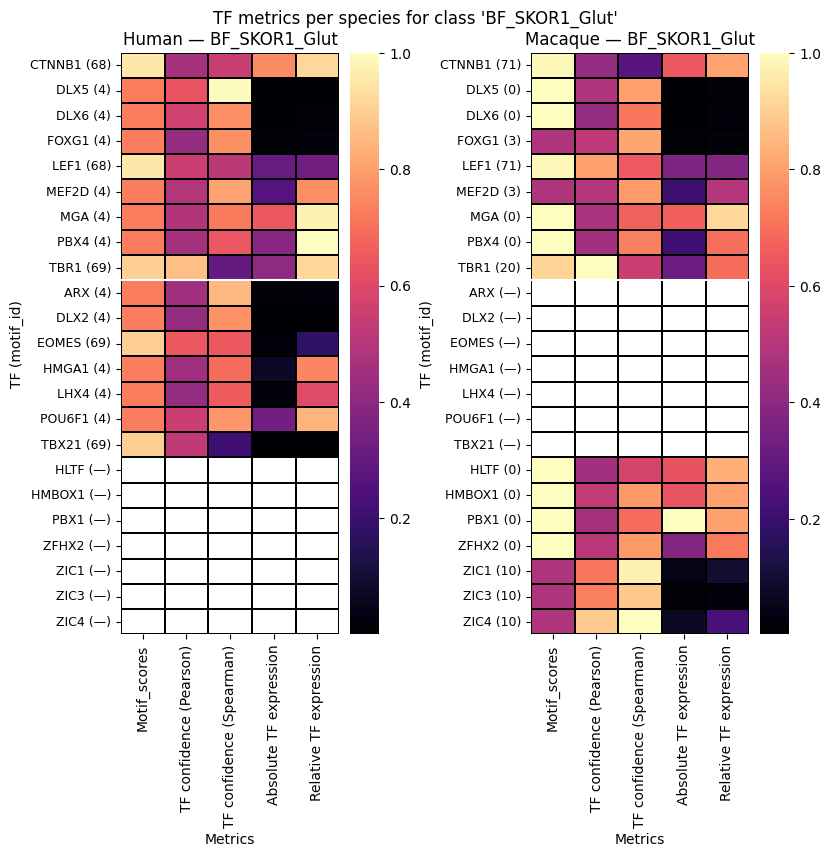

Failed to plot class 'B_cells': not enough values to unpack (expected 2, got 0)


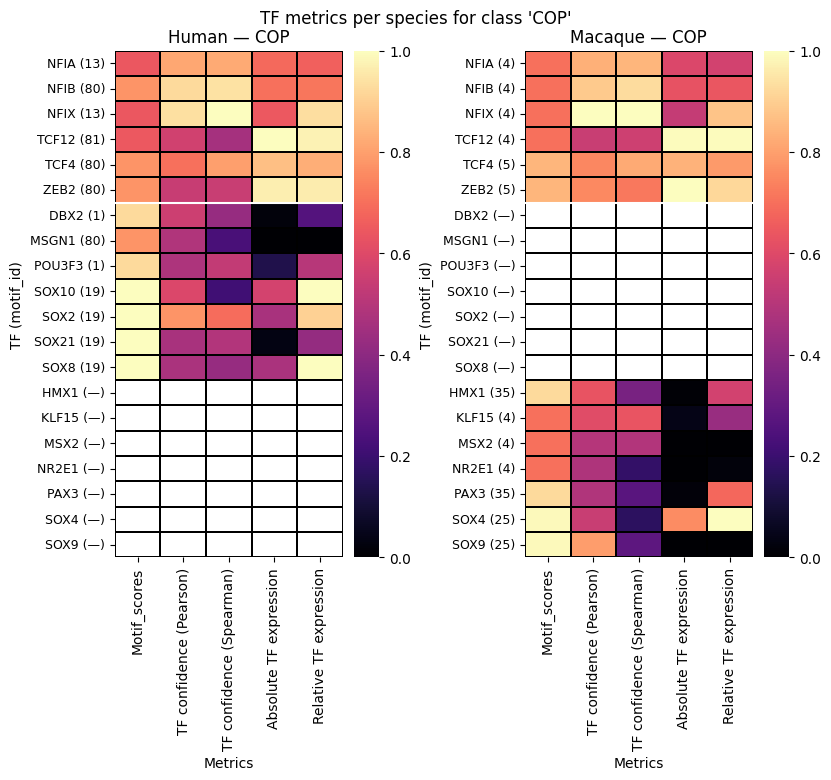

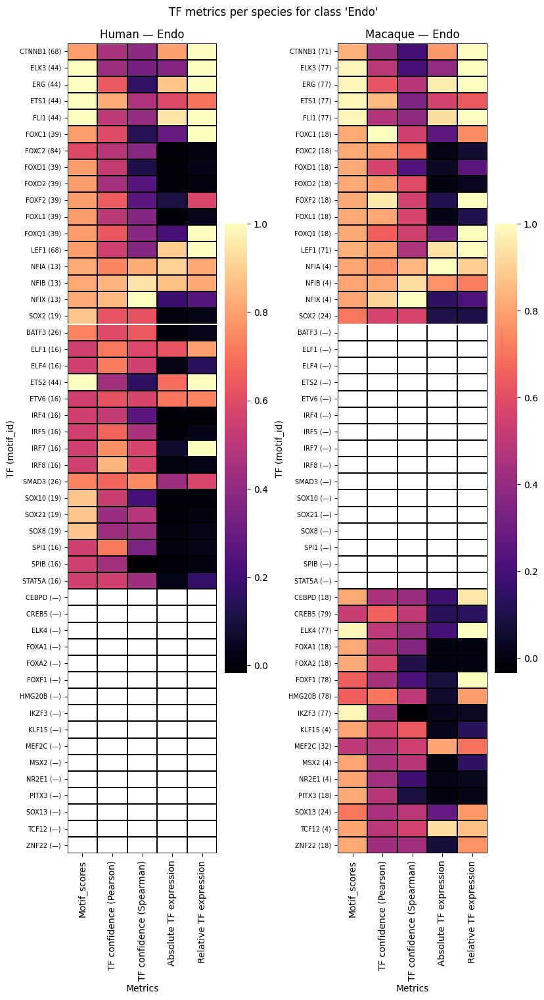

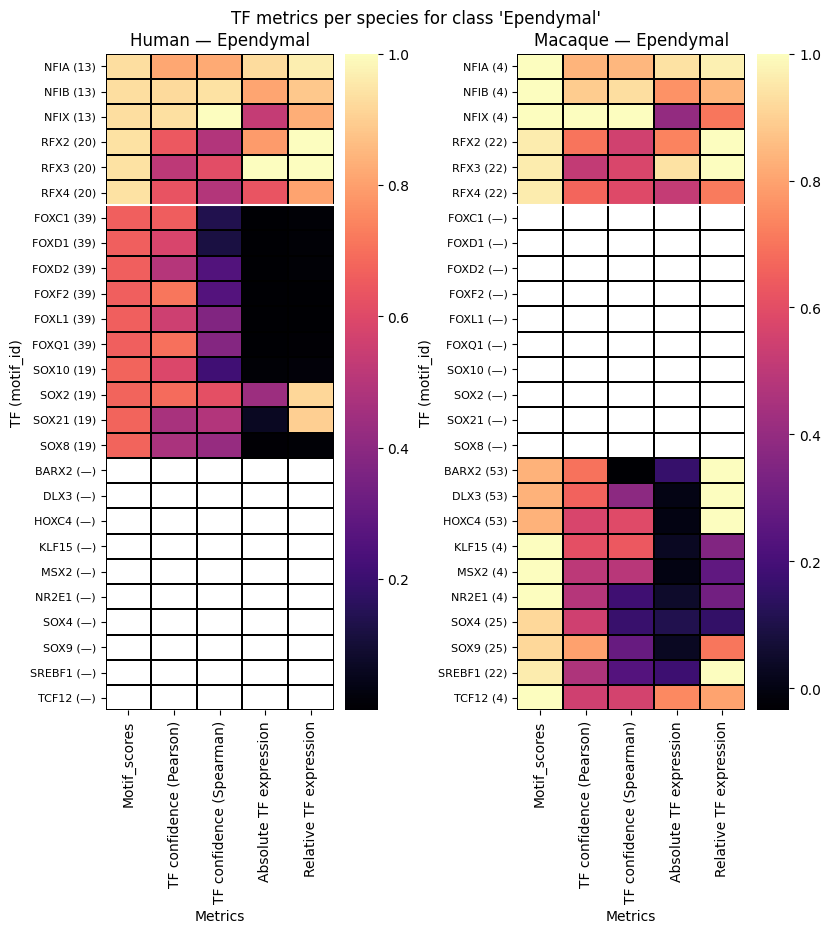

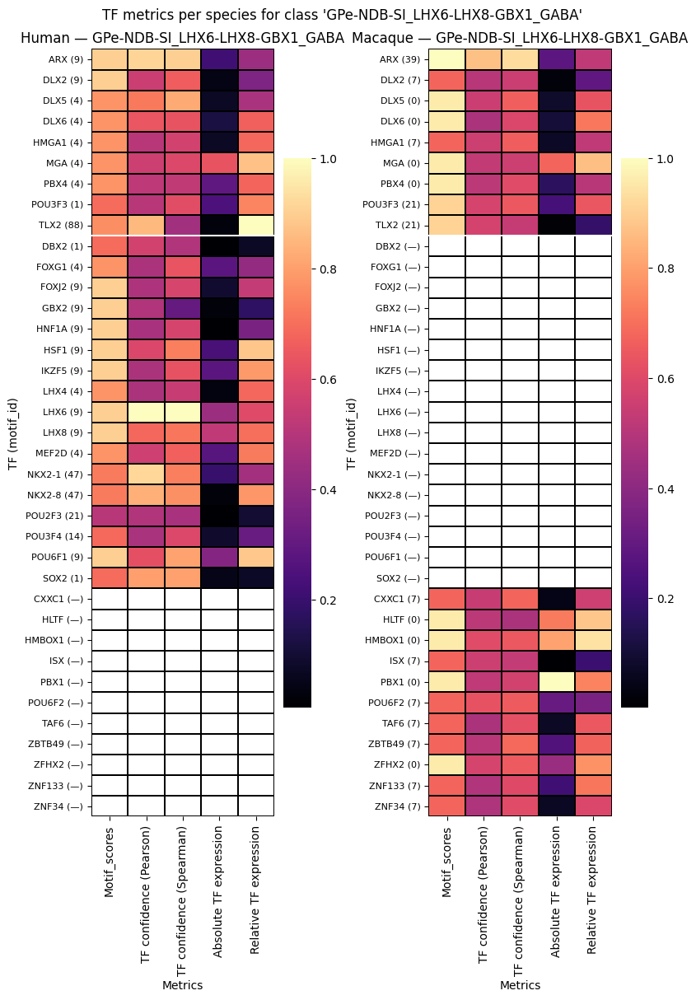

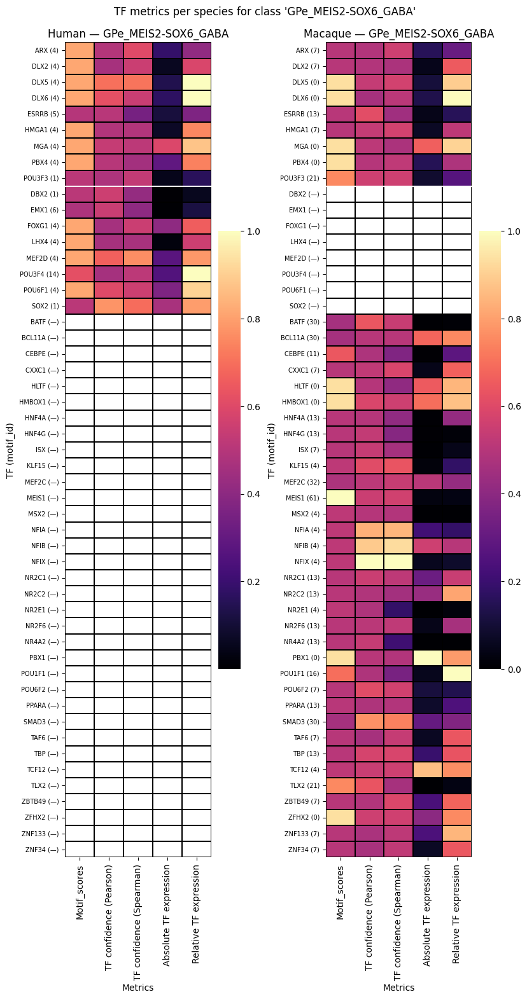

...

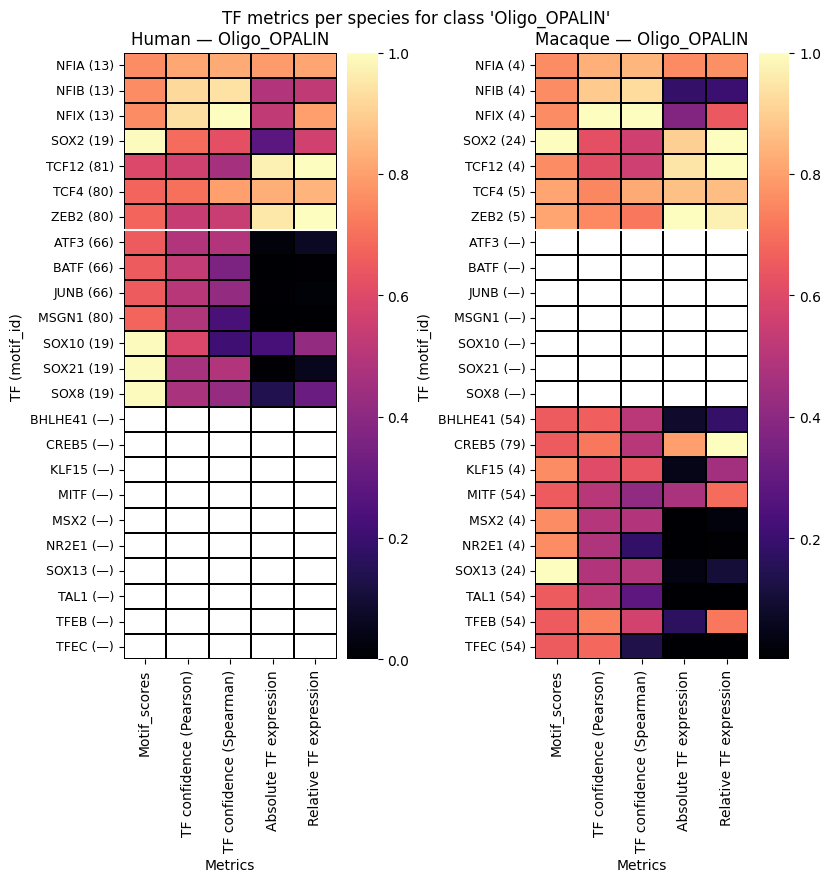

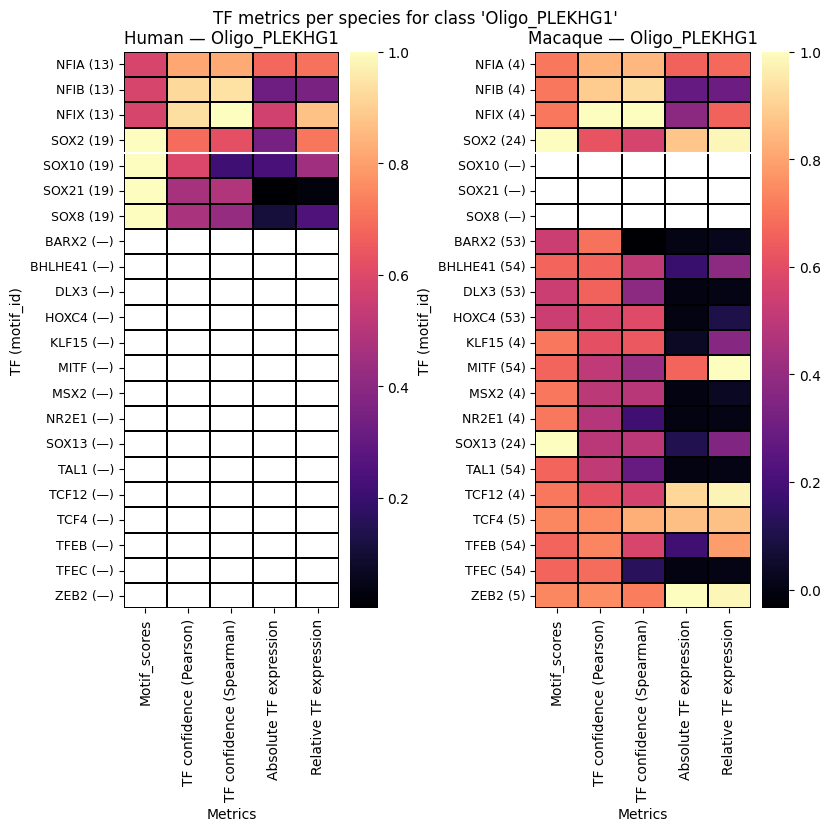

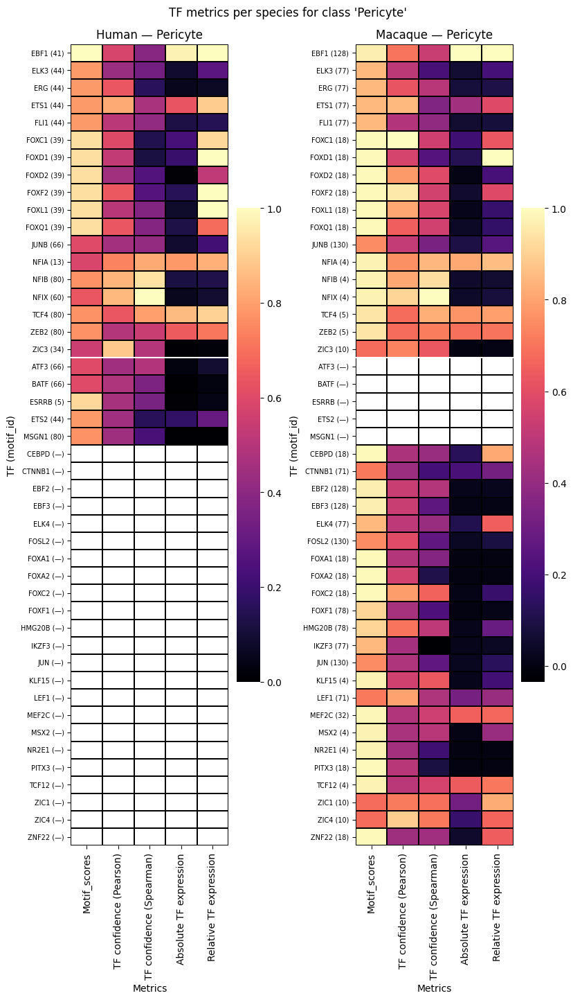

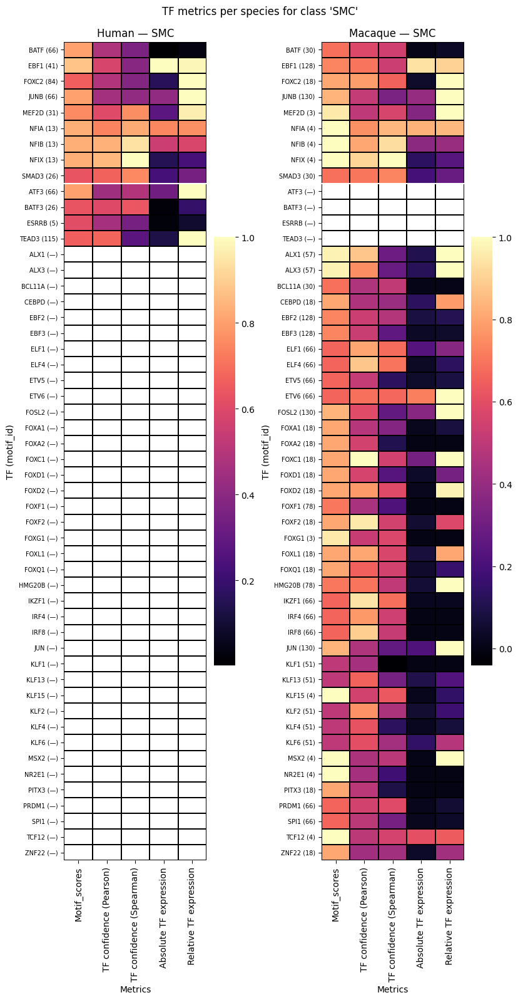

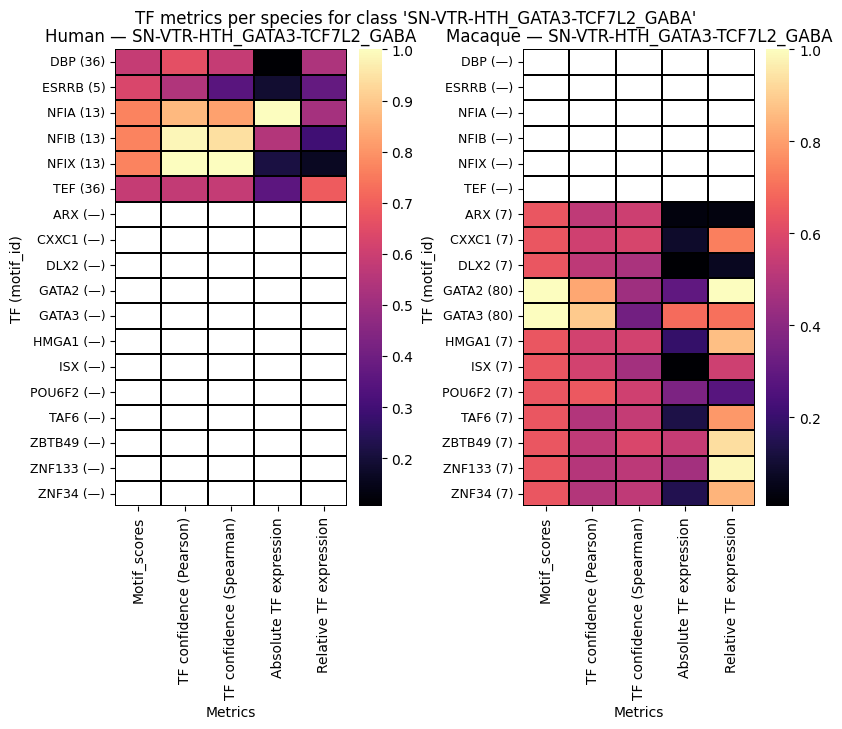

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


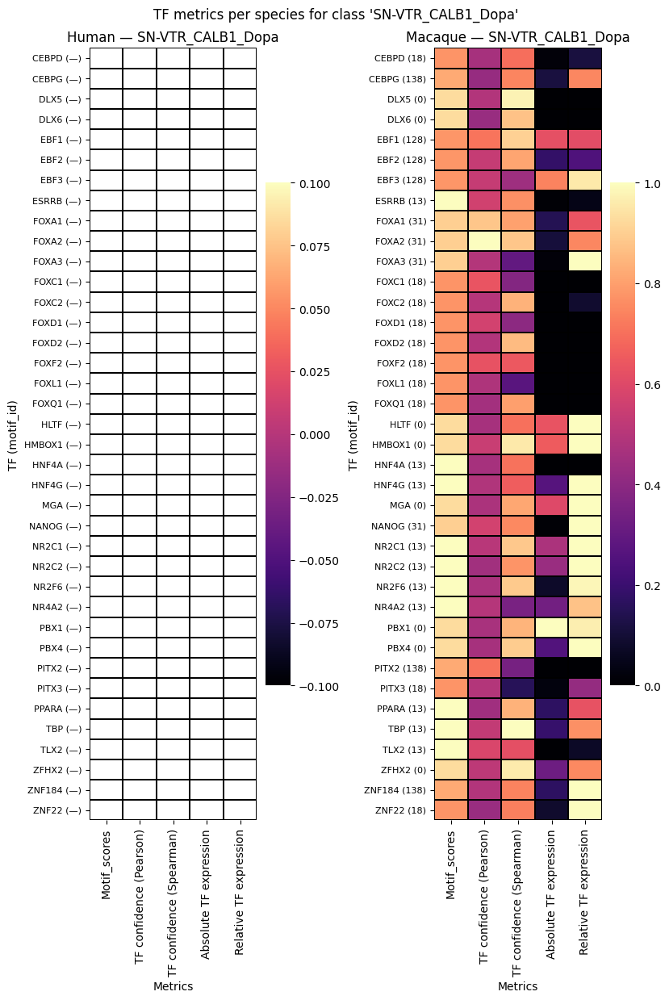

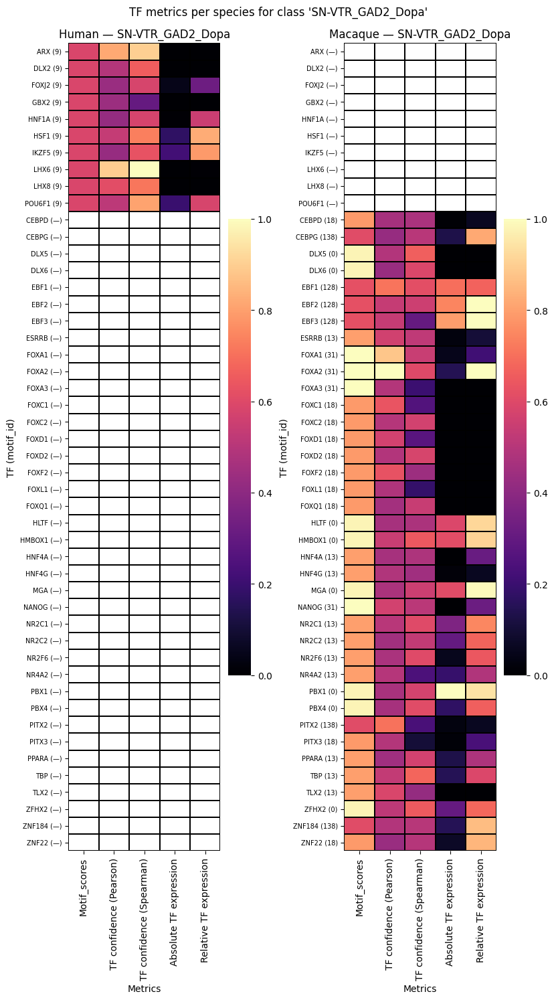

Failed to plot class 'SN_EBF2_GABA': not enough values to unpack (expected 2, got 0)
Failed to plot class 'SN_SEMA5A_GABA': not enough values to unpack (expected 2, got 0)


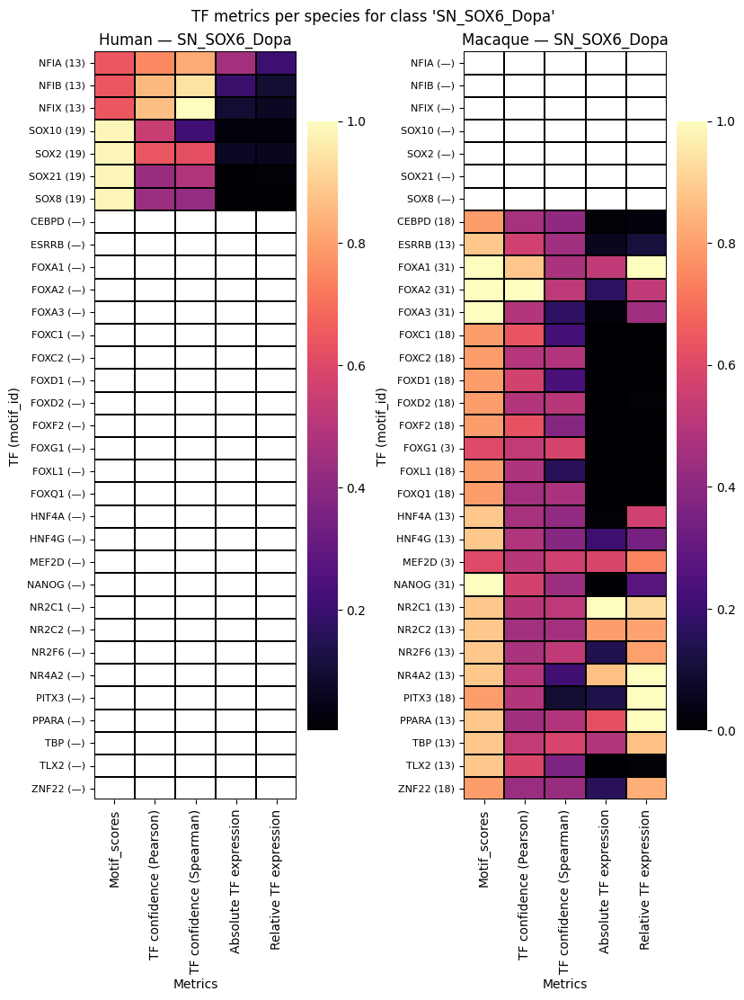

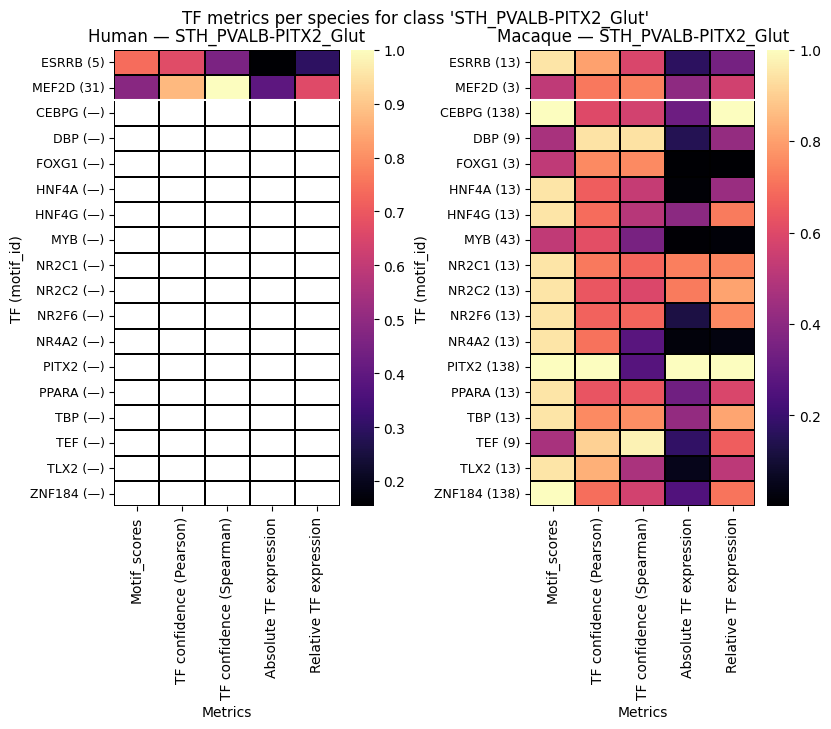

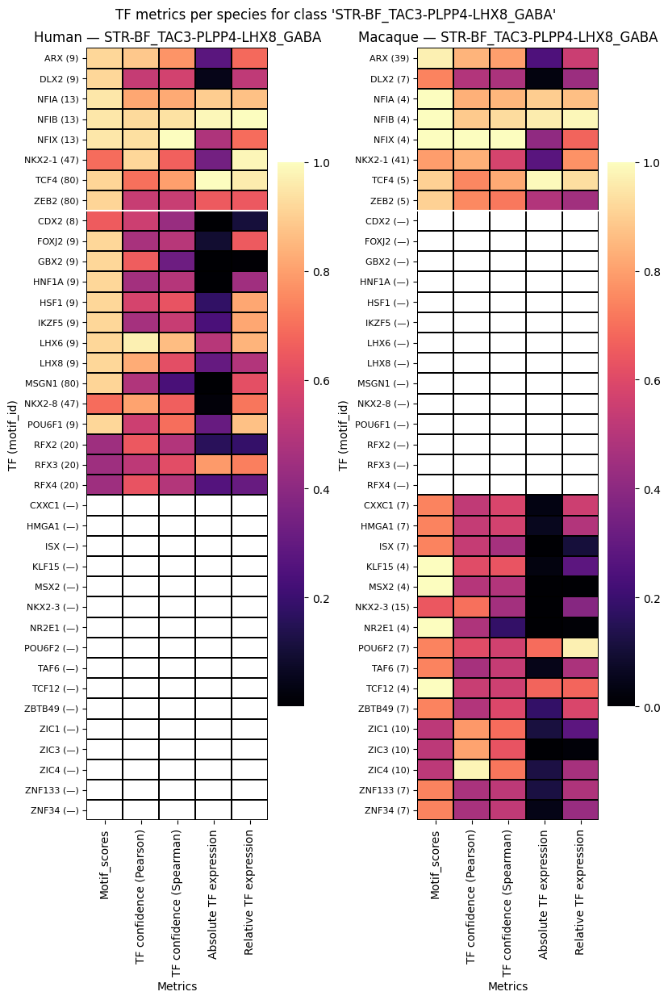

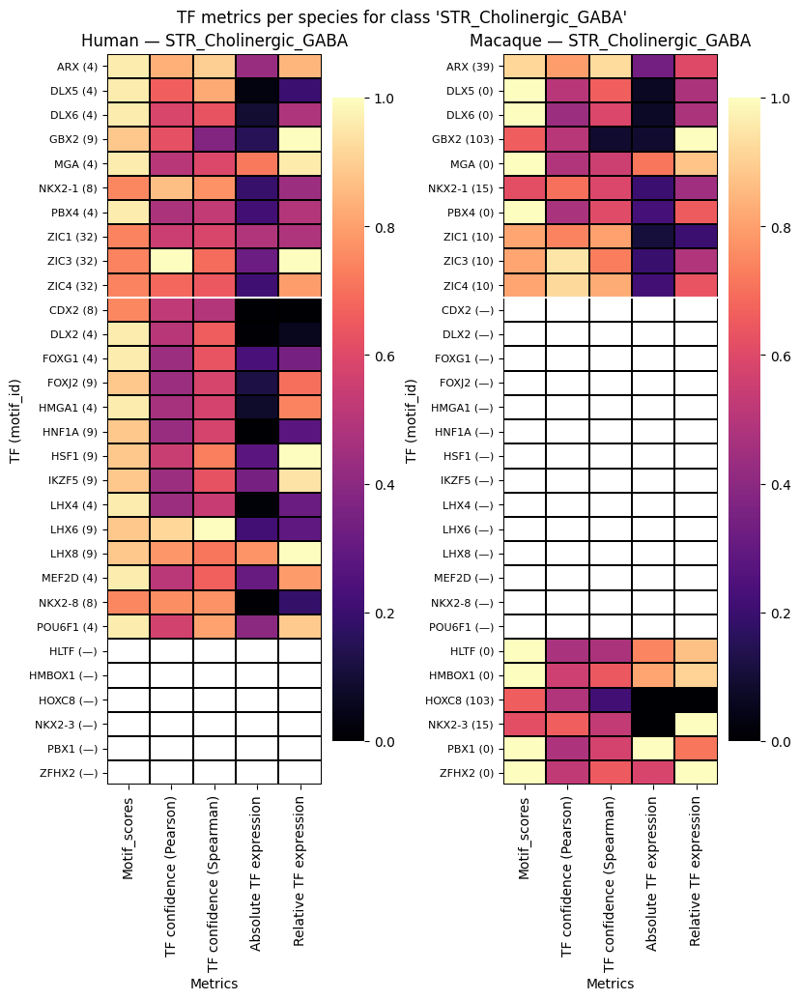

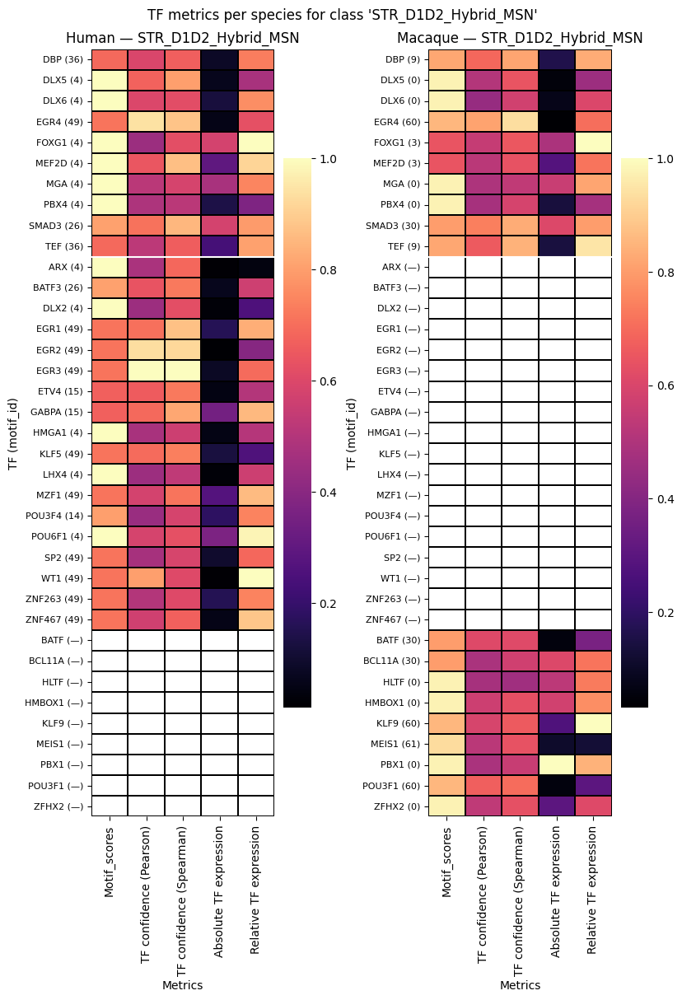

...

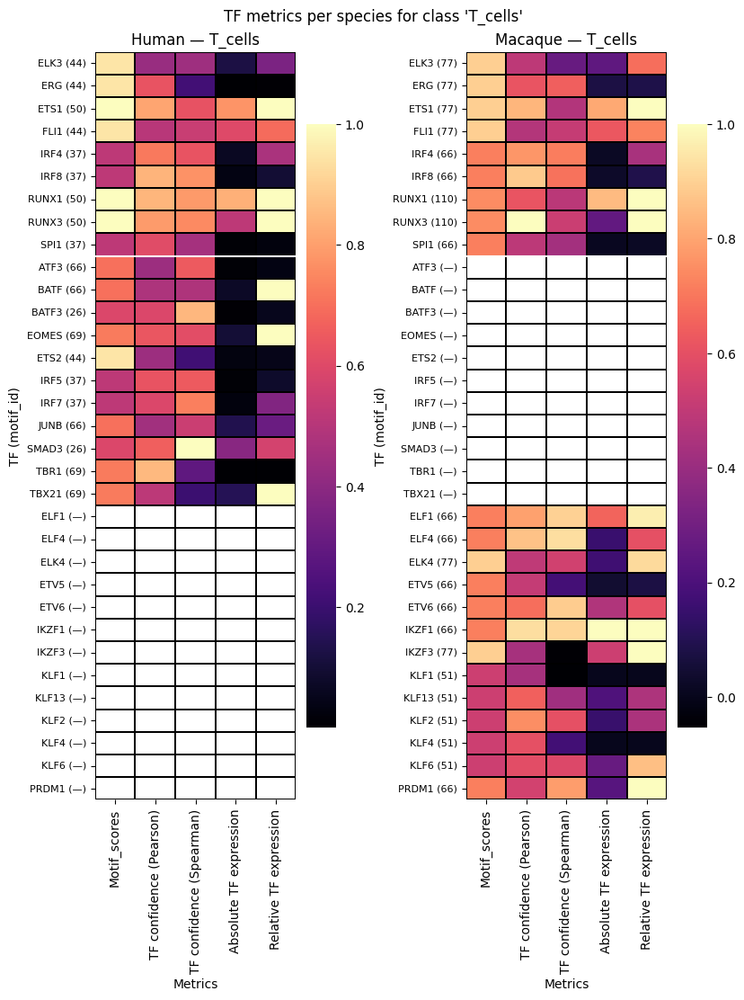

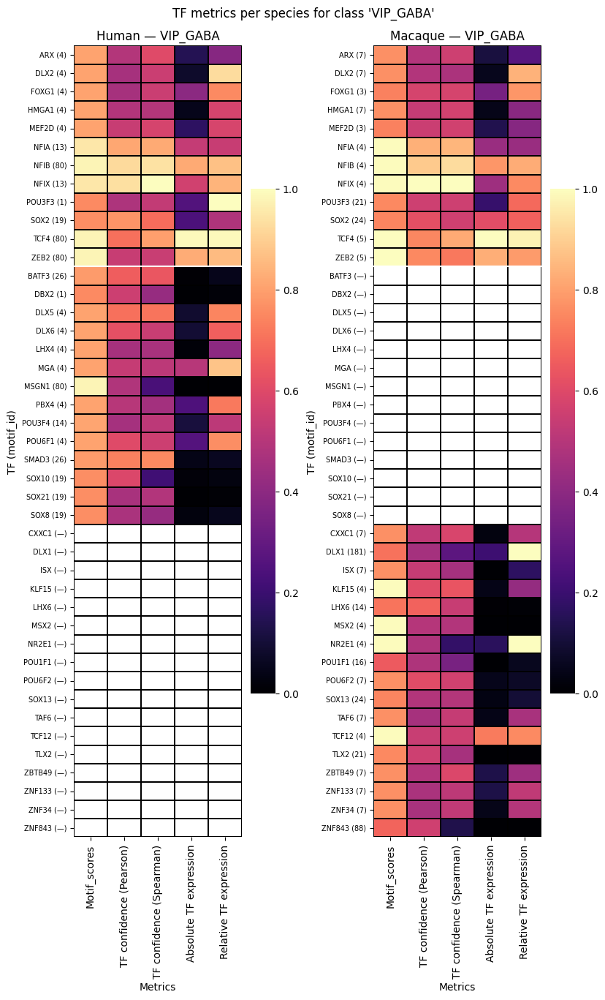

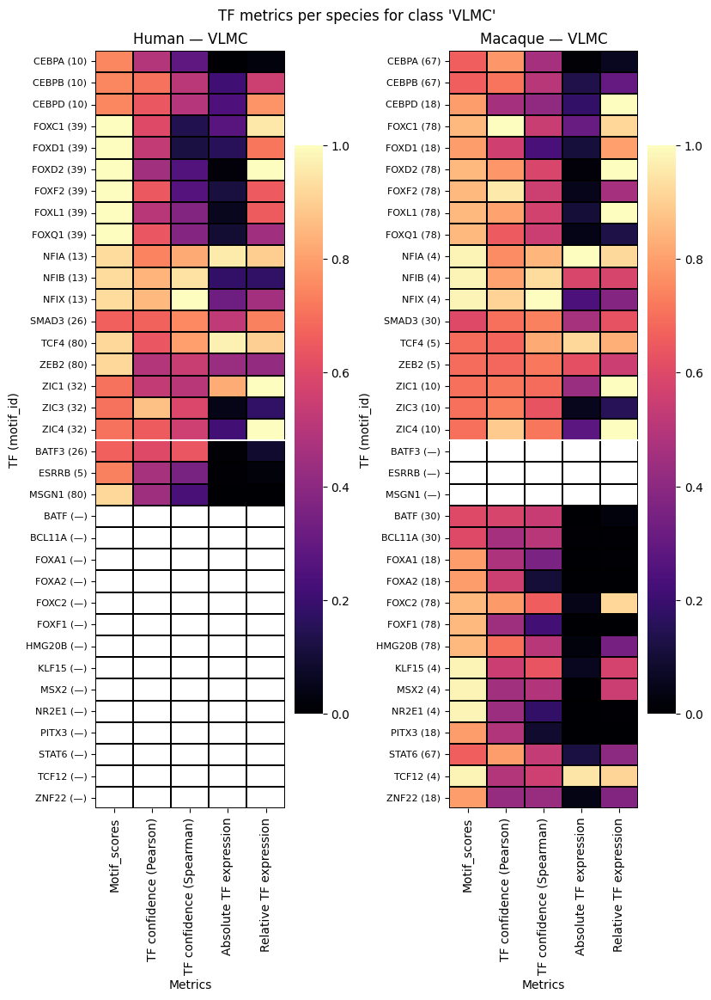

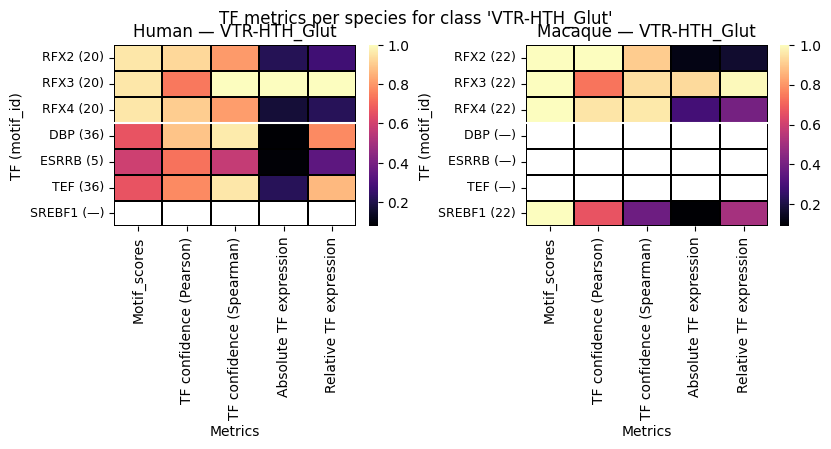

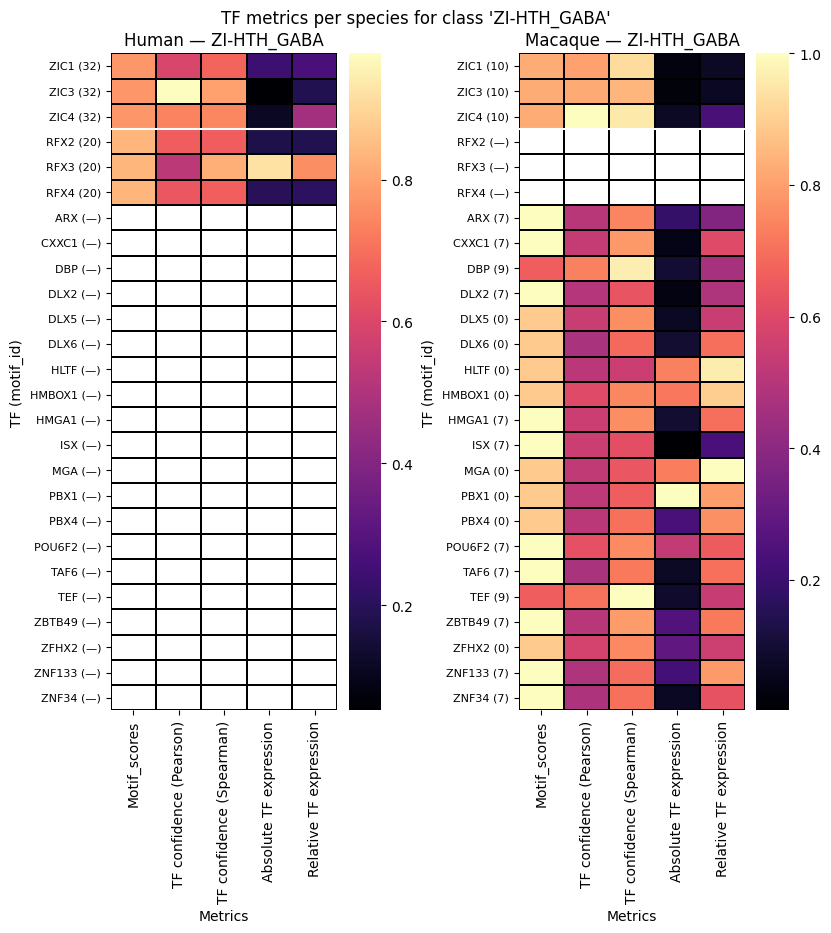

In [25]:
for cl in class_lists[0]:
    try:
        plot_class_tf_heatmaps(
            tf_ct_dict,
            class_name=cl,
            save_path=(
                "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/"
                "aibs-octo-dnaseq-modeling/basal-ganglia/data/cross_species/"
                f"motif_analysis/comparison_plots/human_macaque/{cl}.png"
            )
        )
    except Exception as e:
        print(f"Failed to plot class '{cl}': {e}")